### Import Packages

In [1]:
import pandas as pd
from scipy import stats
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import GridSearchCV
from collections import Counter
from numpy import array
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

%matplotlib inline

# EDA On Categorical Data

In [2]:
survey = pd.read_excel('DDS11_Data_extract_with_labels.xlsx')
columns = [x.split(' ')[0] for x in survey.columns]
column_counter = Counter(columns)
#print(column_counter.most_common())
#print(columns)
new_columns = []
extension = 1
for i in range(len(columns)):
    col = columns[i]
    if column_counter[col] == 1:
        new_columns.append(col)
        extension = 1
    else:
        if (col != columns[i-1]):
            extension = 1
        new_columns.append(col+ "r" + str(extension))
        extension += 1
        #print(extension)
#print(new_columns)
survey.columns = new_columns
survey.head()

,record,Q1r1,Q4,age,Q2,region,QNEW3,Q5,QNEW1,QNEW2r1,QNEW2r2,QNEW2r3,QNEW2r4,QNEW2r5,QNEW2r6,QNEW2r7,Q6,Q8r1,Q8r2,Q8r3,Q8r4,Q8r5,Q8r6,Q8r7,Q8r8,Q8r9,Q8r10,Q8r11,Q8r12,Q8r13,Q8r14,Q8r15,Q8r16,Q8r17,Q8r18,Q8r19,Q8r20,Q8r21,Q10r1,Q10r2,Q10r3,Q10r4,Q10r5,Q10r6,Q10r7,Q10r8,Q10r9,Q10r10,Q10r11,Q10r12,Q10r13,Q10r14,Q10r15,Q10r16,Q10r17,Q10r18,Q10r19,Q10r20,Q10r21,Q11r1,Q11r2,Q11r3,Q11r4,Q11rNew1,Q11r5,Q11r6,Q11r7,Q11r8,Q11r9,Q11r10,Q11r12,Q11r14,Q11r15,Q11r17,Q11r18,Q11r19,Q11rNew2,Q11rNew3,Q11r22,Q15r1,Q15r2,Q15r3,Q15r4,Q16r1,Q16r2,Q16r3,Q16r4,Q17r1,Q17r2,Q17r3,Q17r4,Q22r1,Q22r2,Q22r3,Q22r4,Q22r5,Q22r6,Q22r7,Q22r8,Q22r9,Q22r10,Q22r11,Q22r12,Q22r13,Q22r14,Q22r15,Q22r16,Q22r17,Q22r18,Q22r19,Q22r20,Q22r21,Q22r22,Q22r23,Q22r24,Q22r25,Q22r26,Q22r27,Q22r28,Q22r29,Q22r30,Q22r31,Q22r32,Q22r33,Q22r34,Q22r35,Q22r36,Q22r37,Q26r1,Q26r2,Q26r3,Q26r4,Q26r5,Q26r6,Q26r7,Q26r8,Q26r9,Q26r10,Q26r11,Q26r12,Q36r1,Q36r2,Q36r3,Q36r4,Q36r5,Q36r6,Q36r7,Q36r8,Q36r9,Q36r10,Q29,Q37r1,Q37r2,Q37r3,Q37r4,Q37r5,Q37r6,Q37r7,Q37r8,Q37r9,Q37r10,QNEW19r1,QNEW19r2,QNEW19r3,QNEW19r4,QNEW19r5,QNEW19r6,QNEW20r1,QNEW20r2,QNEW20r3,QNEW20r4,QNEW20r5,QNEW24,QNEW28,QNEW29,Q73r2,Q73r3,Q73r4,Q73r5,Q73r6,Q73r7,Q73r8,Q73r9,Q73r10,Q73r11,Q73r12,Q73r13,Q39r1,Q39rNEW1,Q39rNEW2,Q39rNEW3,Q39rNEW4,Q39rNEW5,Q39r2,Q39r3,Q39r4,Q89,FINAL
0,4,36,Male,34-50,Georgia,South,Employed full-time or part-time,White or Caucasian (Non-Hispanic),Yes,No,No,Yes,Yes,No,No,No,"$50,000 to $99,999",No,No,No,No,No,No,Yes,No,No,No,Yes,No,No,No,No,Yes,No,No,No,No,No,No,No,No,Yes,No,No,No,No,No,No,No,Yes,No,Yes,No,No,No,No,Yes,No,No,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,0,0,100,0,0,0,100,0,0,0,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,No,No,No,No,No,No,No,Yes,Yes,No,No,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,2.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,2.0,3.0,NaN,NaN,Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Frequently (every day/weekly),Yes,Frequently (every day/weekly),Television programming,Almost always (greater than 75% of the time),Always (close to 100% of the time),Always (close to 100% of the time),Almost always (greater than 75% of the time),Almost always (greater than 75% of the time),Almost always (greater than 75% of the time),Almost always (greater than 75% of the time),Always (close to 100% of the time),Almost always (greater than 75% of the time),Always (close to 100% of the time),Always (close to 100% of the time),Always (close to 100% of the time),Agree somewhat,Agree strongly,Agree somewhat,Agree somewhat,Agree strongly,Agree strongly,Agree strongly,Agree somewhat,Agree strongly,Magazine,0.083025
1,6,26,Female,20-26,New York,Northeast,Employed full-time or part-time,White or Caucasian (Non-Hispanic),Yes,Yes,Yes,No,No,No,No,No,"$50,000 to $99,999",No,No,No,Yes,No,Yes,No,Yes,No,No,Yes,Yes,No,Yes,No,Yes,No,No,No,No,No,No,No,Yes,No,No,No,No,No,No,No,No,No,Yes,No,No,No,Yes,No,No,No,No,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,40,30,30,0,40,30,30,0,30,30,40,0,Yes,Yes,Yes,No,Yes,No,Yes,Yes,No,Yes,No,No,Yes,Yes,No,No,Yes,Yes,No,No,No,No,No,No,No,Yes,No,No,No,Yes,Yes,No,Yes,No,No,No,No,Yes,Yes,Yes,No,Yes,Yes,No,No,No,No,No,No,NaN,1.0,2.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,I am willing to pay $20 per month on top of wh...,NaN,NaN,NaN,NaN,3.0,NaN,NaN,2.0,NaN,1.0,Occasionally (monthly),Occasionally (monthly),Occasionally (monthly),Occasionally (monthly),Frequently (every day/weekly),Occasionally (monthly),Occasionally (monthly),Occasionally (monthly),Occasionally (monthly),Frequently (every day/weekly),Occasionally (monthly),No,Frequently (every day/weekly),Movies,Rarely (10%-50% of t

In [2]:
data = pd.read_pickle(r'categorical_data.pkl')
data.head()

,"Q1r1 - To begin, what is your age?",Q4 - What is your gender?,age - you are...,Q2 - In which state do you currently reside?,region - Region,QNEW3 - What is your employment status?,Q5 - Which category best describes your ethnicity?,QNEW1 - Do you have children living in your home (excluding yourself if you are under 18)?,QNEW2 - How old are the children in your home?-0-4 years,QNEW2 - How old are the children in your home?-5-9 years,QNEW2 - How old are the children in your home?-10-13 years,QNEW2 - How old are the children in your home?-14-18 years,QNEW2 - How old are the children in your home?-19-25 years,QNEW2 - How old are the children in your home?-26+ years,QNEW2 - How old are the children in your home?-Don't Know,"Q6 - Into which of the following categories does your total annual household income fall before taxes? Again, we promise to keep this, and all your answers, completely confidential.",Q8 - Which of the following media or home entertainment equipment does your household own?-Flat panel television,Q8 - Which of the following media or home entertainment equipment does your household own?-Digital video recorder (DVR),Q8 - Which of the following media or home entertainment equipment does your household own?-Streaming media box or over-the-top box,Q8 - Which of the following media or home entertainment equipment does your household own?-Portable streaming thumb drive/fob,Q8 - Which of the following media or home entertainment equipment does your household own?-Over-the-air digital TV antenna (for free access to network broadcast without pay TV subscription),Q8 - Which of the following media or home entertainment equipment does your household own?-Blu-ray disc player/DVD player,Q8 - Which of the following media or home entertainment equipment does your household own?-Gaming console,Q8 - Which of the following media or home entertainment equipment does your household own?-Portable video game player,Q8 - Which of the following media or home entertainment equipment does your household own?-Computer network/router in your home for wireless computer/laptop usage,Q8 - Which of the following media or home entertainment equipment does your household own?-Desktop computer,Q8 - Which of the following media or home entertainment equipment does your household own?-Laptop computer,Q8 - Which of the following media or home entertainment equipment does your household own?-Tablet,Q8 - Which of the following media or home entertainment equipment does your household own?-Dedicated e-book reader,Q8 - Which of the following media or home entertainment equipment does your household own?-Smartphone,Q8 - Which of the following media or home entertainment equipment does your household own?-Basic mobile phone (not a smartphone),Q8 - Which of the following media or home entertainment equipment does your household own?-Smart watch,Q8 - Which of the following media or home entertainment equipment does your household own?-Fitness band,Q8 - Which of the following media or home entertainment equipment does your household own?-Virtual reality headset,Q8 - Which of the following media or home entertainment equipment does your household own?-Drone,Q8 - Which of the following media or home entertainment equipment does your household own?-None of the above,Q8 - Which of the following media or home entertainment equipment does your household own?-Don't Know,"Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Flat panel television","Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Digital video recorder (DVR)","Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purchase in the next 12 months?-Streaming media box or over-the-top box","Q10 - Of those products you indicated you do not currently own, which of the following do you plan to purcha

In [3]:
columns = [x.split(' ')[0] for x in data.columns]
column_counter = Counter(columns)
#print(column_counter.most_common())
#print(columns)
new_columns = []
extension = 1
for i in range(len(columns)):
    col = columns[i]
    if column_counter[col] == 1:
        new_columns.append(col)
        extension = 1
    else:
        if (col != columns[i-1]):
            extension = 1
        new_columns.append(col+ "r" + str(extension))
        extension += 1
        #print(extension)
#print(new_columns)
data.columns = new_columns

In [4]:
data.head()

,Q1r1,Q4,age,Q2,region,QNEW3,Q5,QNEW1,QNEW2r1,QNEW2r2,QNEW2r3,QNEW2r4,QNEW2r5,QNEW2r6,QNEW2r7,Q6,Q8r1,Q8r2,Q8r3,Q8r4,Q8r5,Q8r6,Q8r7,Q8r8,Q8r9,Q8r10,Q8r11,Q8r12,Q8r13,Q8r14,Q8r15,Q8r16,Q8r17,Q8r18,Q8r19,Q8r20,Q8r21,Q10r1,Q10r2,Q10r3,Q10r4,Q10r5,Q10r6,Q10r7,Q10r8,Q10r9,Q10r10,Q10r11,Q10r12,Q10r13,Q10r14,Q10r15,Q10r16,Q10r17,Q10r18,Q10r19,Q10r20,Q10r21,Q11r1,Q11r2,Q11r3,Q11r4,Q11rNew1,Q11r5,Q11r6,Q11r7,Q11r8,Q11r9,Q11r10,Q11r12,Q11r14,Q11r15,Q11r17,Q11r18,Q11r19,Q11rNew2,Q11rNew3,Q15r1,Q15r2,Q15r3,Q15r4,Q16r1,Q16r2,Q16r3,Q16r4,Q17r1,Q17r2,Q17r3,Q17r4,Q22r1,Q22r2,Q22r3,Q22r4,Q22r5,Q22r6,Q22r7,Q22r8,Q22r9,Q22r10,Q22r11,Q22r12,Q22r13,Q22r14,Q22r15,Q22r16,Q22r17,Q22r18,Q22r19,Q22r20,Q22r21,Q22r22,Q22r23,Q22r24,Q22r25,Q22r26,Q22r27,Q22r28,Q22r29,Q22r30,Q22r31,Q22r32,Q22r33,Q22r34,Q22r35,Q22r36,Q22r37,Q26r1,Q26r2,Q26r3,Q26r4,Q26r5,Q26r6,Q26r7,Q26r8,Q26r9,Q26r10,Q26r11,Q26r12,Q36r1,Q36r2,Q36r3,Q36r4,Q36r5,Q36r6,Q36r7,Q36r8,Q36r9,Q36r10,Q29,Q37r1,Q37r2,Q37r3,Q37r4,Q37r5,Q37r6,Q37r7,Q37r8,Q37r9,Q37r10,QNEW19r1,QNEW19r2,QNEW19r3,QNEW19r4,QNEW19r5,QNEW19r6,QNEW20r1,QNEW20r2,QNEW20r3,QNEW20r4,QNEW20r5,QNEW24,QNEW28,QNEW29,Q73r2,Q73r3,Q73r4,Q73r5,Q73r6,Q73r7,Q73r8,Q73r9,Q73r10,Q73r11,Q73r12,Q73r13,Q39r1,Q39rNEW1,Q39rNEW2,Q39rNEW3,Q39rNEW4,Q39rNEW5,Q39r2,Q39r3,Q39r4,Q89
0,36.0,1,3,10,2,0,9,1,0,0,1,1,0,0,0,2,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,6,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,0,2,2,0,0,0,0,2,0,2,2,2,0,1,0,0,1,1,1,0,1,Magazine
1,26.0,0,1,32,1,0,9,1,1,1,0,0,0,0,0,2,0,0,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,30.0,30.0,0.0,40.0,30.0,30.0,0.0,30.0,30.0,40.0,0.0,1,1,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,0,0,0,0.0,1.0,2.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,2,0.0,0.0,0.0,0.0,3.0,0.0,0.0,2.0,0.0,1.0,2,2,2,2,0,2,2,2,2,0,2,0,0,0,4,4,4,3,3,4,0,2,0,3,4,4,2,0,0,2,2,2,0,2,2,Print newspapers
2,32.0,0,2,30,1,0,9,1,1,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,6,3.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,2,0,0,0,2,2,2,0,2,0,0,1,0,3,0,0,2,2,0,2,2,0,0,0,2,0,0,0,0,1,1,1,0,1,1,News aggregators
3,25.0,0,1,4,3,0,9,1,1,1,0,0,0,0,0,4,1,1,0,1,0,1,1,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0.0,1.0,0.0,3.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,25.0,15.0,50.0,10.0,15.0,0.0,75.0,0.0,25.0,0.0,75.0,1,1,1,1,1,0,1,1,1,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,0,0,2.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,4,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,0.0,0,2,2,2,0,2,0,0,0,0,2,1,0,3,3,4,0,3,3,4,2,4,0,2,2,3,1,1,1,1,1,1,1,1,1,Online version of newspapers
4,28.0,1,2,14,0,3,9,1,1,0,0,0,0,0,0,2,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,10.0,80.0,5.0,0.0,0.0,95.0,10.0,0.0,0.0,90.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,2,3,3,2,0,1,3,1,3,0,1,1,0,3,3,4,3,1,3,4,3,4,1,4,4,3,2,0,2,4,2,2,0,0,2,Online version of newspapers


#### Explore the potential target variables and visualize distributions, relationships, etc.

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Magazine'),
  Text(1, 0, 'Print newspapers'),
  Text(2, 0, 'News aggregators'),
  Text(3, 0, 'Online version of newspapers'),
  Text(4, 0, 'Social media sites'),
  Text(5, 0, 'Television news stations'),
  Text(6, 0, 'I do not follow the news'),
  Text(7, 0, 'Online news sites not associated with a traditional news organization'),
  Text(8, 0, 'Radio'),
  Text(9, 0, 'Variety/talk shows')])

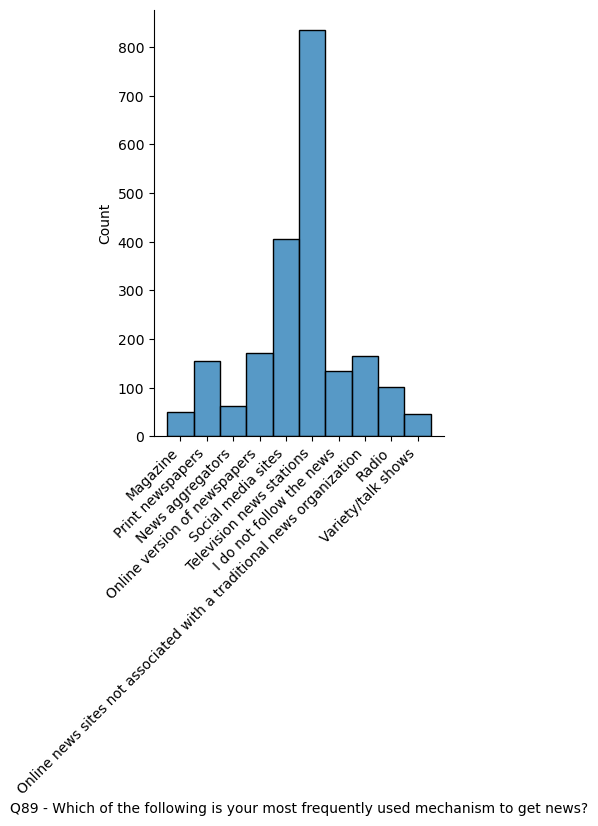

In [78]:
sns.displot(data, x=data.columns[-1])
plt.xticks(rotation=45, ha='right')

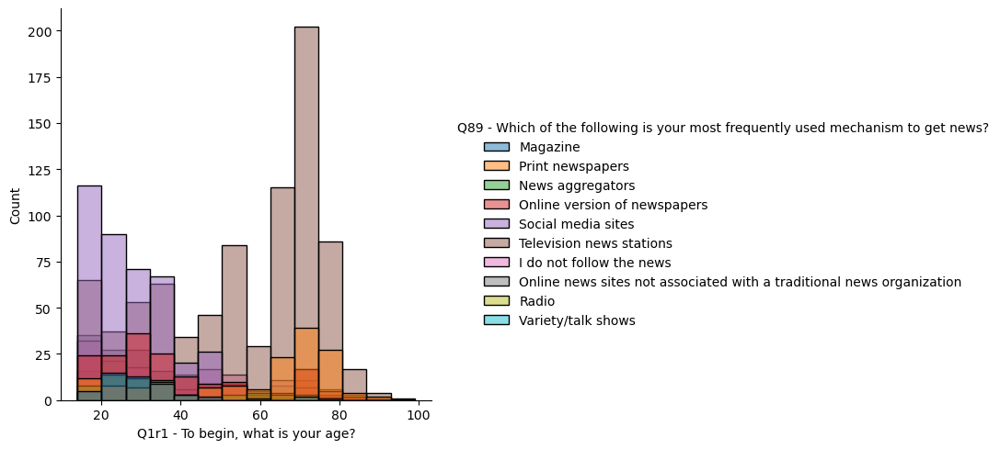

In [68]:
sns.displot(data, x=data.columns[0], hue=data.columns[-1])

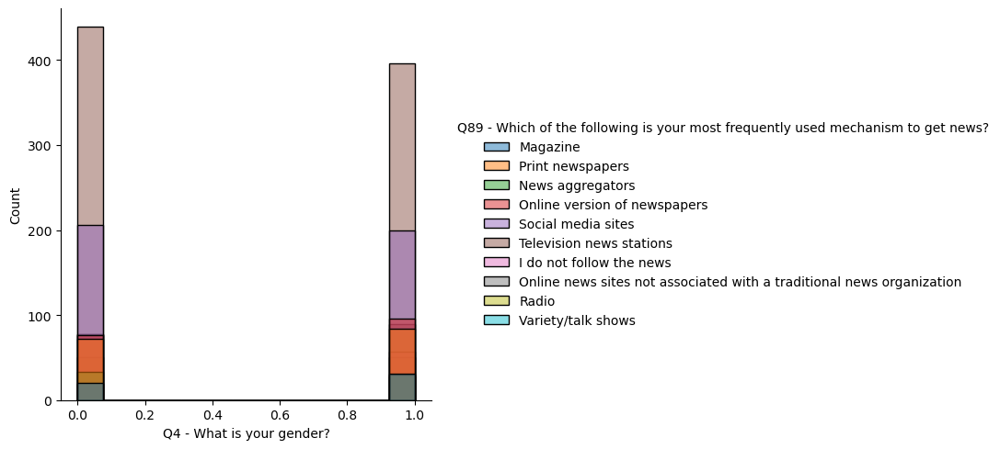

In [70]:
sns.displot(data, x=data.columns[1], hue=data.columns[-1])

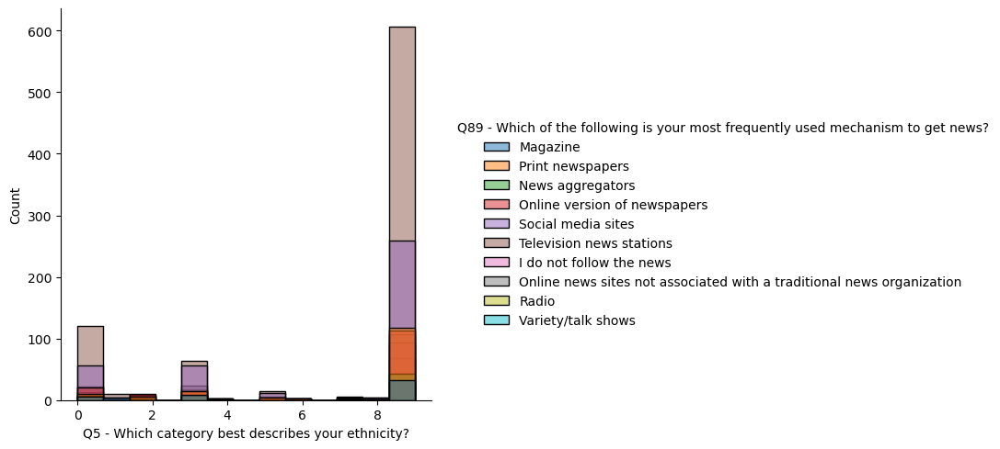

In [71]:
sns.displot(data, x=data.columns[6], hue=data.columns[-1])

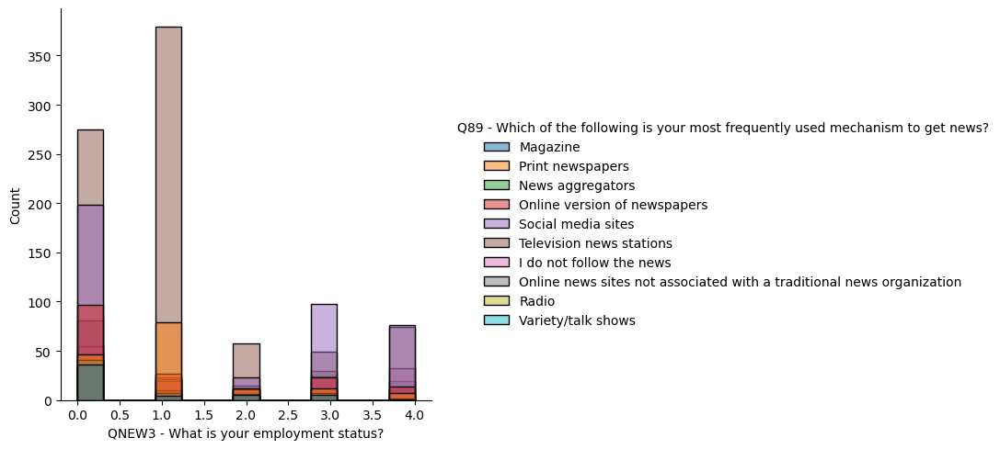

In [72]:
sns.displot(data, x=data.columns[5], hue=data.columns[-1])

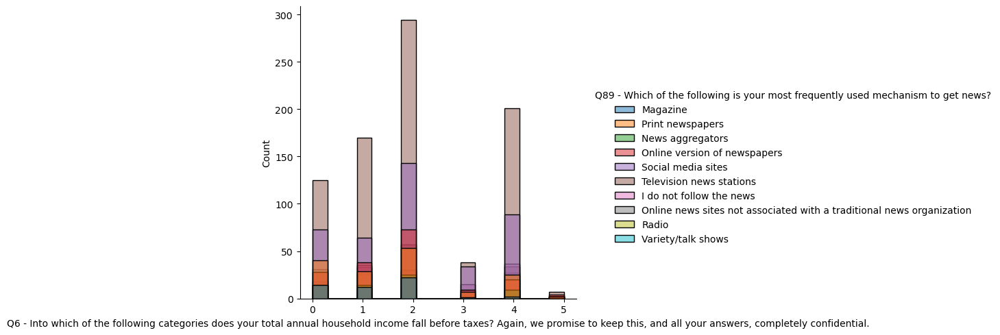

In [79]:
sns.displot(data, x=data.columns[15], hue=data.columns[-1])

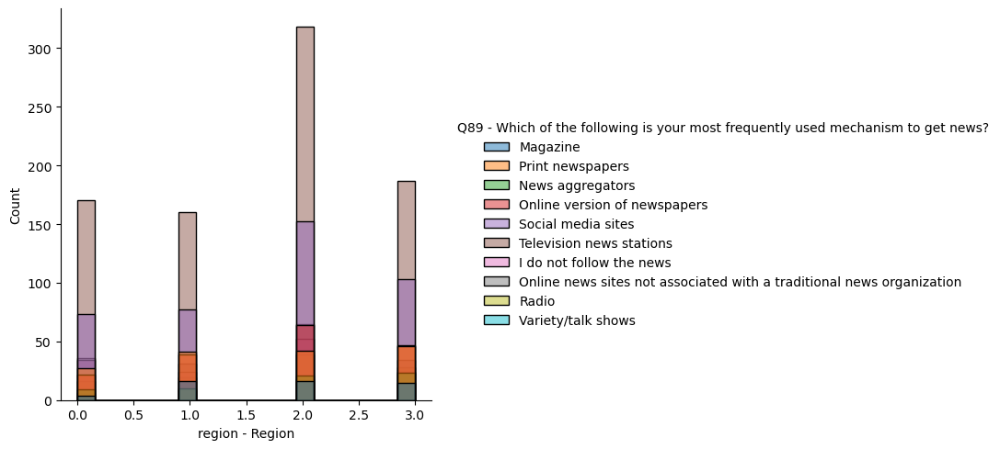

In [113]:
sns.displot(data, x=data.columns[4], hue=data.columns[-1])

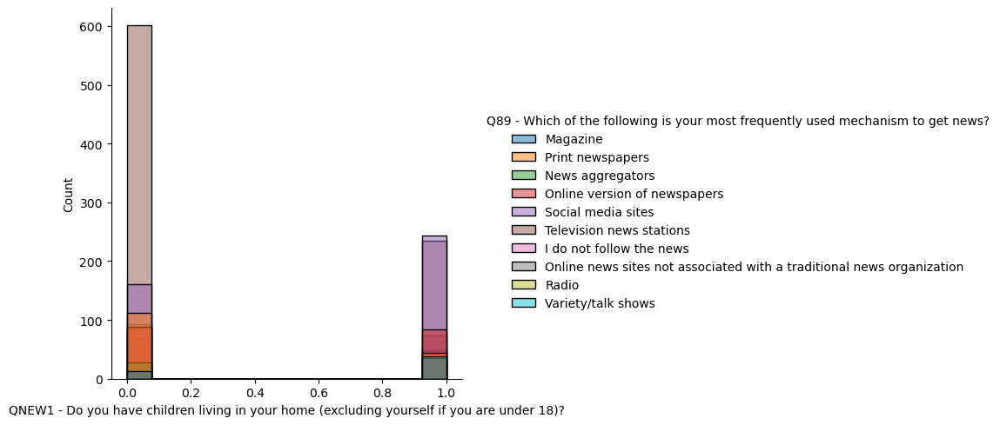

In [115]:
sns.displot(data, x=data.columns[7], hue=data.columns[-1])

#### Examine all features (by one of our main target features)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.draw()
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.draw()
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.draw()
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.draw()
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\utils.py:95:

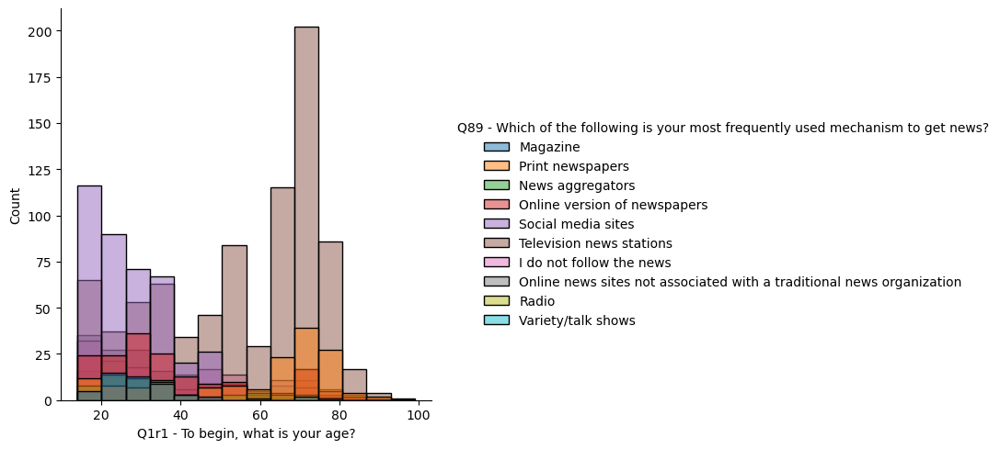

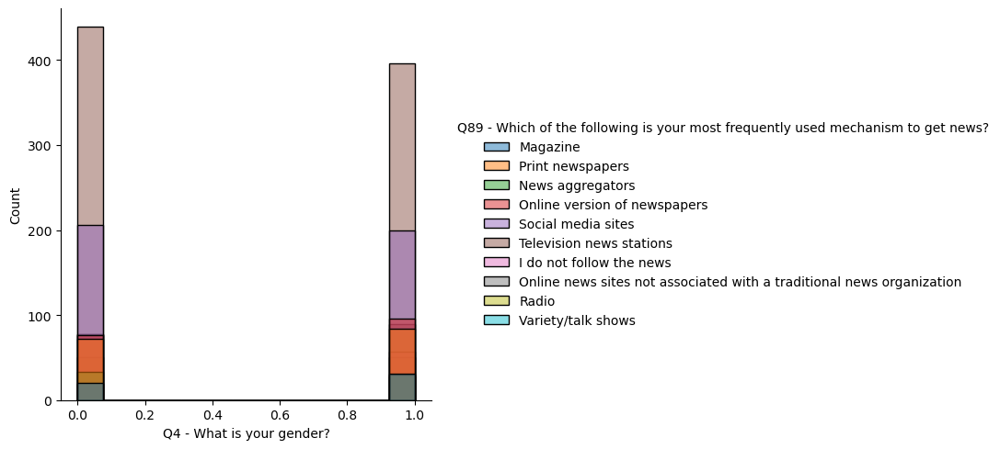

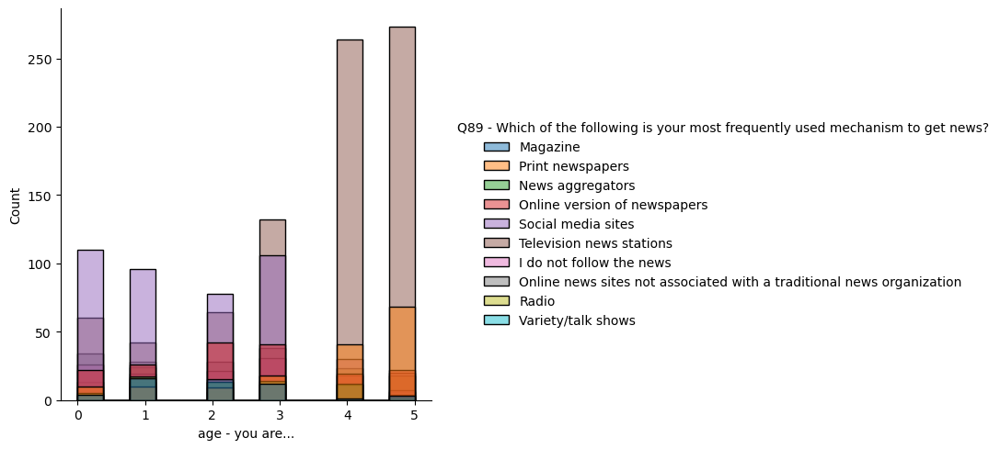

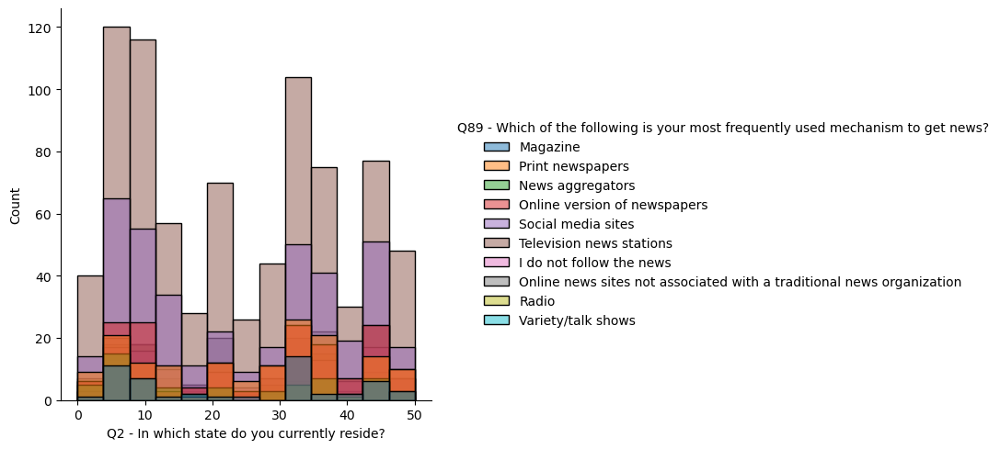

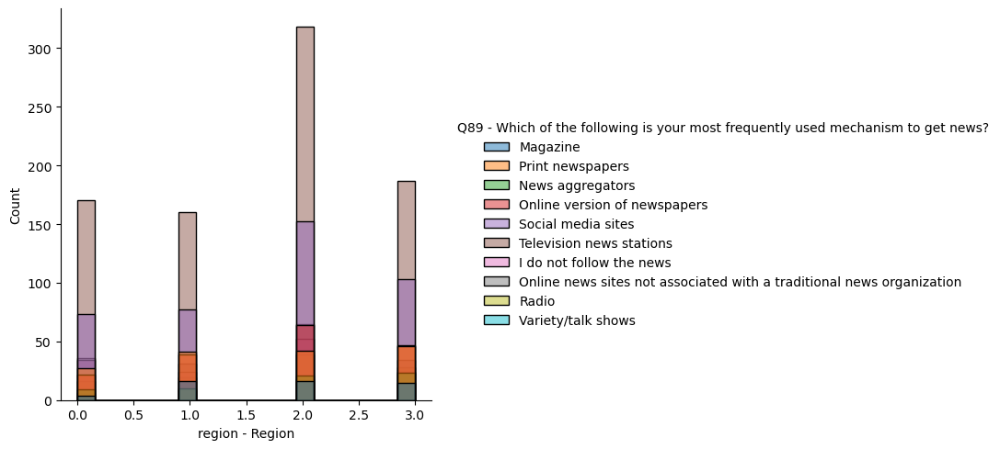

...

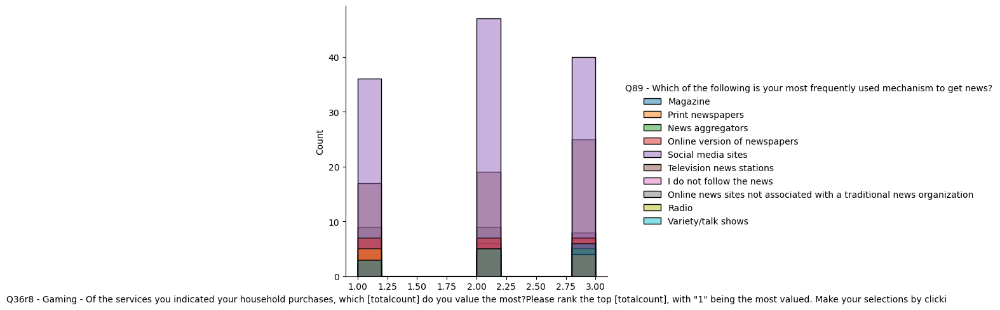

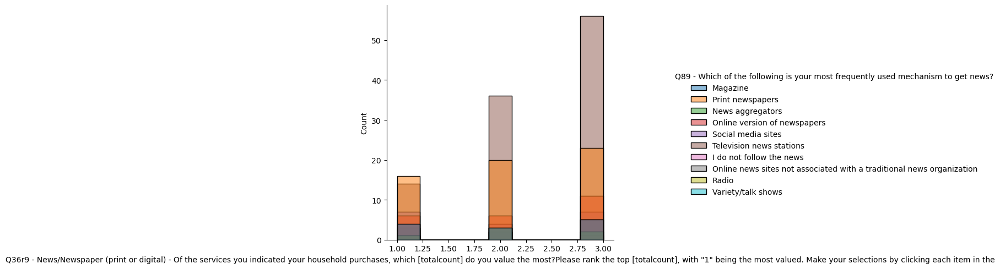

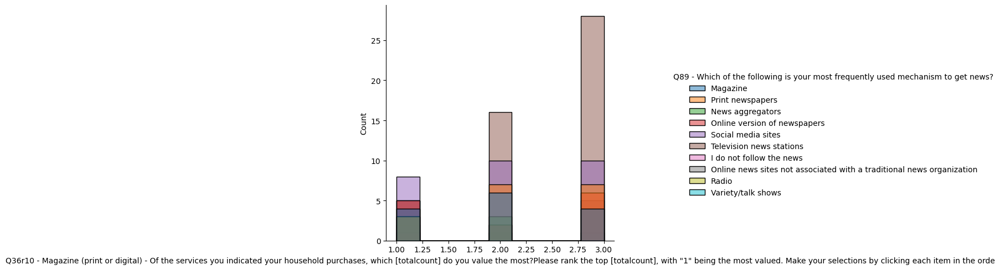

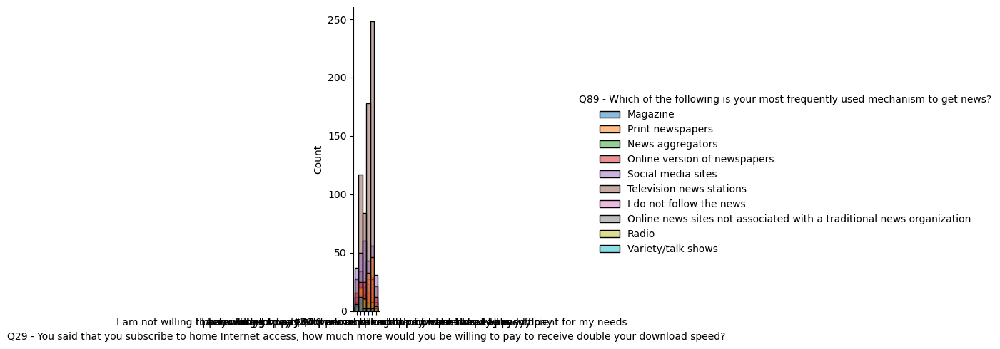

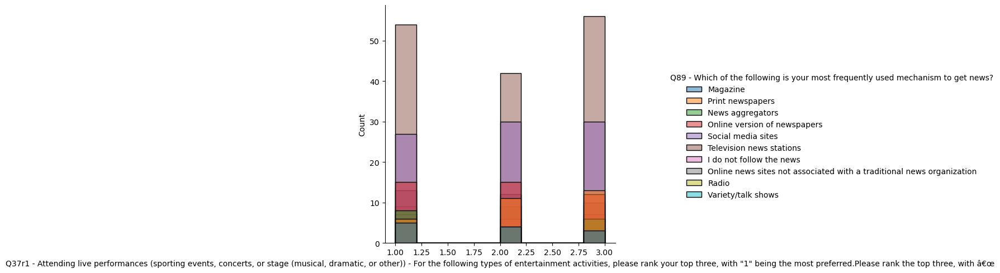

C:\Users\Elliott\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


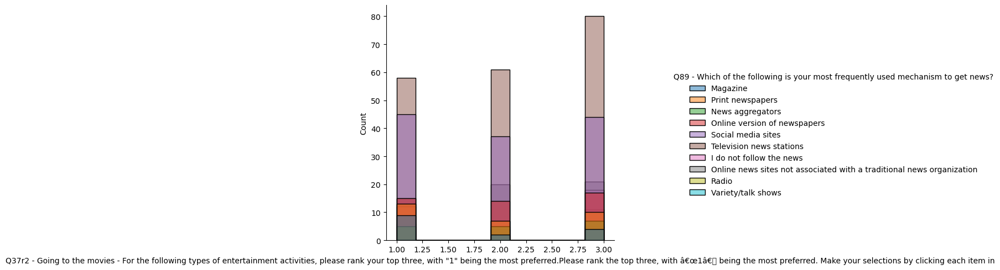

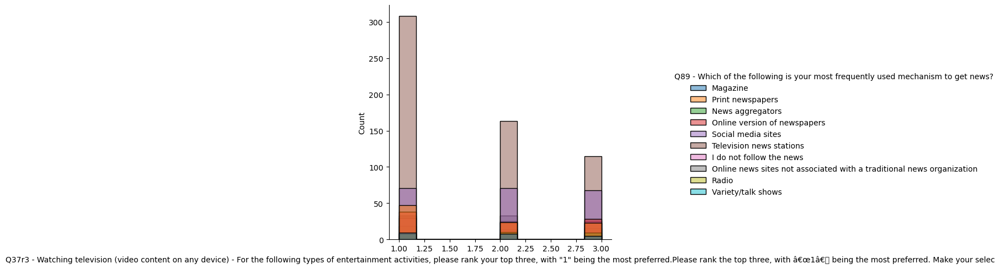

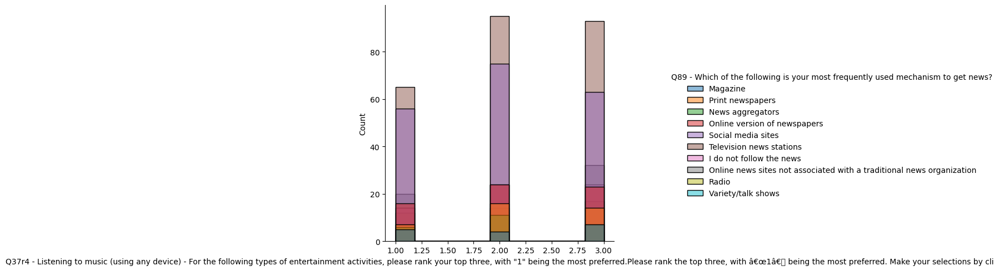

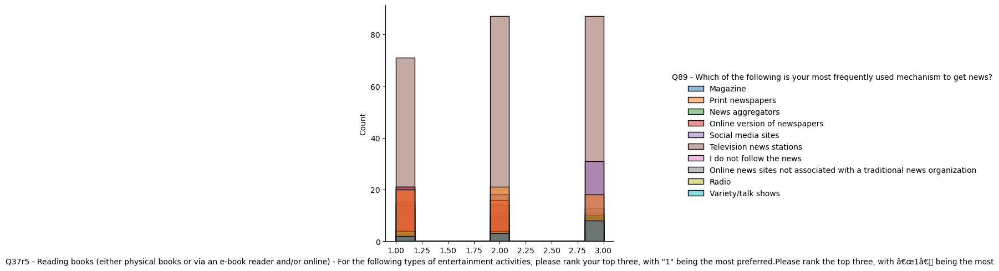

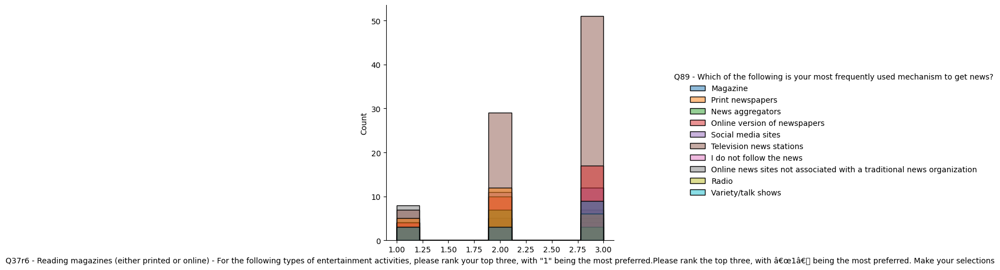

...

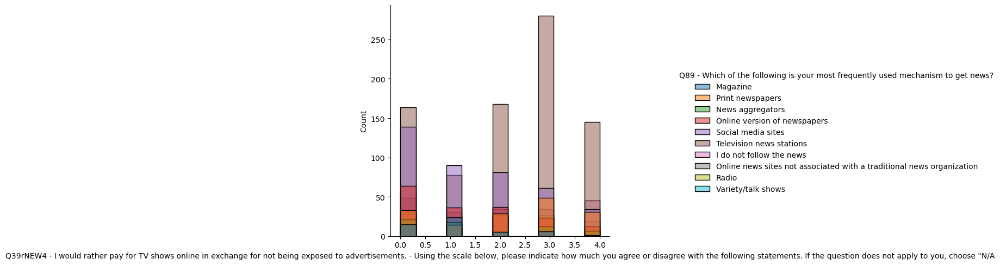

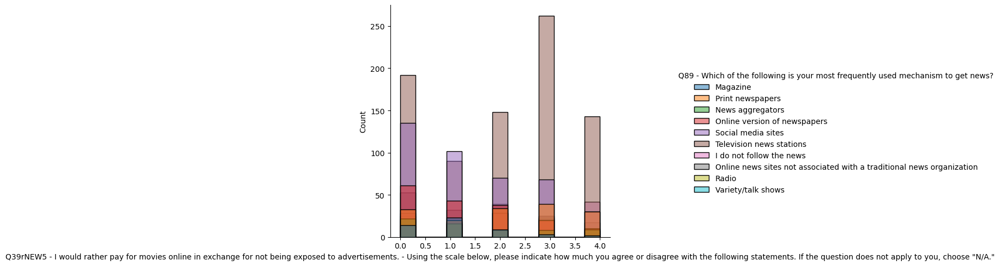

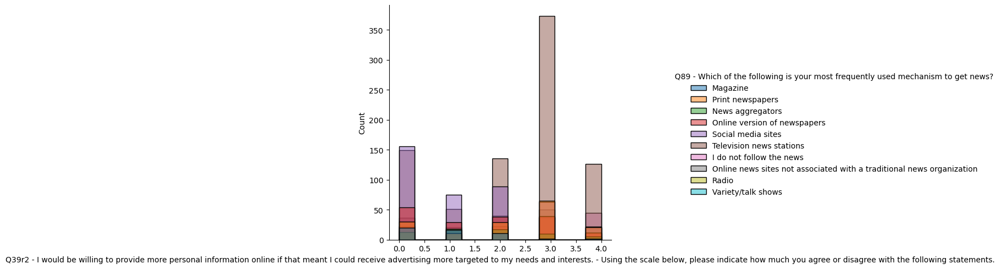

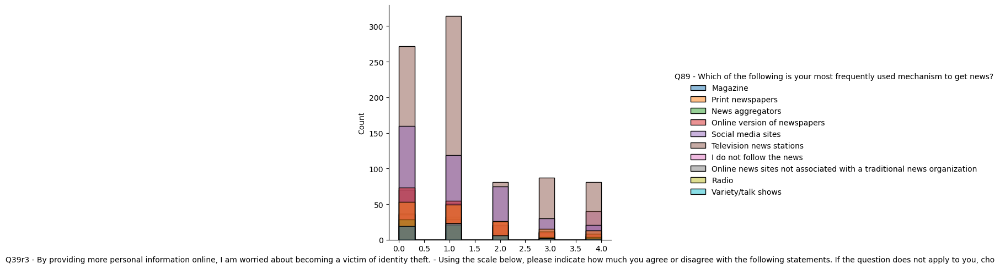

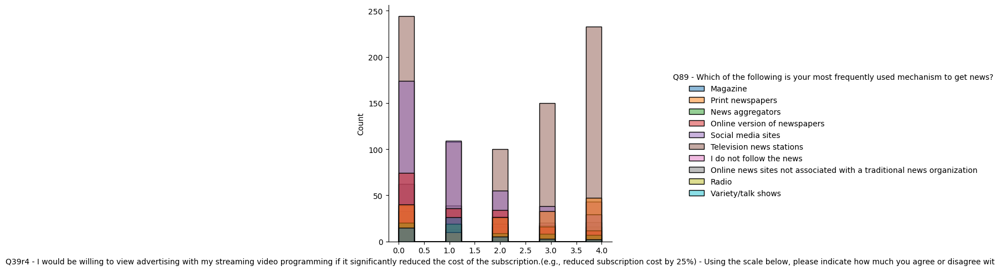

In [116]:
for i in range(len(data.columns)-1):
    sns.displot(data, x=data.columns[i], hue=data.columns[-1])

## Creating Groups Based on Demographic Info

In [3]:
sns.set_palette('coolwarm')

In [4]:
data = pd.read_pickle(r'categorical_data.pkl')

In [5]:
columns = [x.split(' ')[0] for x in data.columns]
column_counter = Counter(columns)
#print(column_counter.most_common())
#print(columns)
new_columns = []
extension = 1
for i in range(len(columns)):
    col = columns[i]
    if column_counter[col] == 1:
        new_columns.append(col)
        extension = 1
    else:
        if (col != columns[i-1]):
            extension = 1
        new_columns.append(col+ "r" + str(extension))
        extension += 1
        #print(extension)
#print(new_columns)
data.columns = new_columns

In [6]:
data.head()

,Q1r1,Q4,age,Q2,region,QNEW3,Q5,QNEW1,QNEW2r1,QNEW2r2,QNEW2r3,QNEW2r4,QNEW2r5,QNEW2r6,QNEW2r7,Q6,Q8r1,Q8r2,Q8r3,Q8r4,Q8r5,Q8r6,Q8r7,Q8r8,Q8r9,Q8r10,Q8r11,Q8r12,Q8r13,Q8r14,Q8r15,Q8r16,Q8r17,Q8r18,Q8r19,Q8r20,Q8r21,Q10r1,Q10r2,Q10r3,Q10r4,Q10r5,Q10r6,Q10r7,Q10r8,Q10r9,Q10r10,Q10r11,Q10r12,Q10r13,Q10r14,Q10r15,Q10r16,Q10r17,Q10r18,Q10r19,Q10r20,Q10r21,Q11r1,Q11r2,Q11r3,Q11r4,Q11rNew1,Q11r5,Q11r6,Q11r7,Q11r8,Q11r9,Q11r10,Q11r12,Q11r14,Q11r15,Q11r17,Q11r18,Q11r19,Q11rNew2,Q11rNew3,Q15r1,Q15r2,Q15r3,Q15r4,Q16r1,Q16r2,Q16r3,Q16r4,Q17r1,Q17r2,Q17r3,Q17r4,Q22r1,Q22r2,Q22r3,Q22r4,Q22r5,Q22r6,Q22r7,Q22r8,Q22r9,Q22r10,Q22r11,Q22r12,Q22r13,Q22r14,Q22r15,Q22r16,Q22r17,Q22r18,Q22r19,Q22r20,Q22r21,Q22r22,Q22r23,Q22r24,Q22r25,Q22r26,Q22r27,Q22r28,Q22r29,Q22r30,Q22r31,Q22r32,Q22r33,Q22r34,Q22r35,Q22r36,Q22r37,Q26r1,Q26r2,Q26r3,Q26r4,Q26r5,Q26r6,Q26r7,Q26r8,Q26r9,Q26r10,Q26r11,Q26r12,Q36r1,Q36r2,Q36r3,Q36r4,Q36r5,Q36r6,Q36r7,Q36r8,Q36r9,Q36r10,Q29,Q37r1,Q37r2,Q37r3,Q37r4,Q37r5,Q37r6,Q37r7,Q37r8,Q37r9,Q37r10,QNEW19r1,QNEW19r2,QNEW19r3,QNEW19r4,QNEW19r5,QNEW19r6,QNEW20r1,QNEW20r2,QNEW20r3,QNEW20r4,QNEW20r5,QNEW24,QNEW28,QNEW29,Q73r2,Q73r3,Q73r4,Q73r5,Q73r6,Q73r7,Q73r8,Q73r9,Q73r10,Q73r11,Q73r12,Q73r13,Q39r1,Q39rNEW1,Q39rNEW2,Q39rNEW3,Q39rNEW4,Q39rNEW5,Q39r2,Q39r3,Q39r4,Q89
0,36.0,1,3,10,2,0,9,1,0,0,1,1,0,0,0,2,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,6,1.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,0,2,2,0,0,0,0,2,0,2,2,2,0,1,0,0,1,1,1,0,1,Magazine
1,26.0,0,1,32,1,0,9,1,1,1,0,0,0,0,0,2,0,0,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,40.0,30.0,30.0,0.0,40.0,30.0,30.0,0.0,30.0,30.0,40.0,0.0,1,1,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,0,0,0,0.0,1.0,2.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,2,0.0,0.0,0.0,0.0,3.0,0.0,0.0,2.0,0.0,1.0,2,2,2,2,0,2,2,2,2,0,2,0,0,0,4,4,4,3,3,4,0,2,0,3,4,4,2,0,0,2,2,2,0,2,2,Print newspapers
2,32.0,0,2,30,1,0,9,1,1,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,100.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,6,3.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,2,0,0,0,2,2,2,0,2,0,0,1,0,3,0,0,2,2,0,2,2,0,0,0,2,0,0,0,0,1,1,1,0,1,1,News aggregators
3,25.0,0,1,4,3,0,9,1,1,1,0,0,0,0,0,4,1,1,0,1,0,1,1,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0.0,1.0,0.0,3.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,25.0,15.0,50.0,10.0,15.0,0.0,75.0,0.0,25.0,0.0,75.0,1,1,1,1,1,0,1,1,1,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,0,0,2.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,4,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,0.0,0,2,2,2,0,2,0,0,0,0,2,1,0,3,3,4,0,3,3,4,2,4,0,2,2,3,1,1,1,1,1,1,1,1,1,Online version of newspapers
4,28.0,1,2,14,0,3,9,1,1,0,0,0,0,0,0,2,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,10.0,80.0,5.0,0.0,0.0,95.0,10.0,0.0,0.0,90.0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,2,3,3,2,0,1,3,1,3,0,1,1,0,3,3,4,3,1,3,4,3,4,1,4,4,3,2,0,2,4,2,2,0,0,2,Online version of newspapers


https://towardsdatascience.com/targeting-multicollinearity-with-python-3bd3b4088d0b

In [7]:
# load statmodels functions
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# compute the vif for all given features
def compute_vif(considered_features):
    
    X = data[considered_features]
    # the calculation of variance inflation requires a constant
    X['intercept'] = 1
    
    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif

In [8]:
data.iloc[0:5,15]

0    2
1    2
2    4
3    4
4    2
Name: Q6, dtype: int8

In [9]:
demo_data = pd.concat([data.iloc[:,0:7], data.iloc[:,15]], axis=1)
demo_data.head()

,Q1r1,Q4,age,Q2,region,QNEW3,Q5,Q6
0,36.0,1,3,10,2,0,9,2
1,26.0,0,1,32,1,0,9,2
2,32.0,0,2,30,1,0,9,4
3,25.0,0,1,4,3,0,9,4
4,28.0,1,2,14,0,3,9,2


#### look at correlation between features

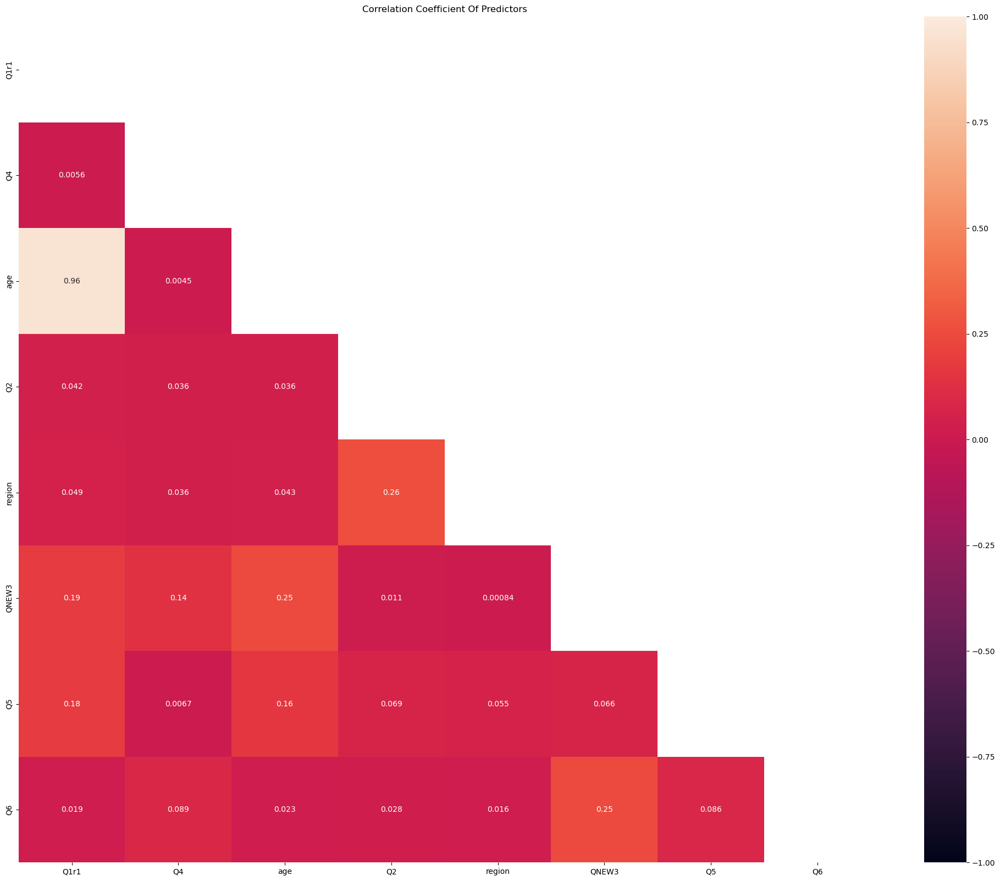

In [10]:
# set figure size
plt.figure(figsize=(25,20))

# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(demo_data.corr(), dtype=bool))

# generate heatmap
sns.heatmap(demo_data.corr().abs(), annot=True, mask=mask, vmin=-1, vmax=1)
plt.title('Correlation Coefficient Of Predictors')
plt.show()

In [11]:
upper_triangle = demo_data.corr().where(np.triu(np.ones(demo_data.corr().shape),k=1).astype(np.bool))
high_corr = [col for col in upper_triangle.columns if any(upper_triangle[col].abs()>.7)]
high_corr

C:\Users\Elliott\AppData\Local\Temp\ipykernel_29320\3521240171.py:1: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper_triangle = demo_data.corr().where(np.triu(np.ones(demo_data.corr().shape),k=1).astype(np.bool))


['age']

#### 'age' (the age range) appears to have a high correlation with the numeric age so compute VIF and drop if above 4

In [12]:
# compute vif 
compute_vif(high_corr).sort_values('VIF', ascending=False)

C:\Users\Elliott\AppData\Local\Temp\ipykernel_29320\2665680971.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


,Variable,VIF
0,age,1.0


not a high VIF so keep it

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

#### ensure data is normalized (because of the numeric age) and then figure out how many clusters we should be looking at for the demographic info

In [14]:
std_scaler = StandardScaler()
demo_data_scaled = std_scaler.fit_transform(demo_data)

Silhouette Score:  0.18255304025523564
Silhouette Score:  0.18484937459148232
Silhouette Score:  0.18827144667614418
Silhouette Score:  0.16980202391756646
Silhouette Score:  0.16941023154807355
Silhouette Score:  0.17132550524502055
Silhouette Score:  0.16952431742474597
Silhouette Score:  0.1736826724254241
Silhouette Score:  0.17711629990633224


<AxesSubplot:title={'center':'Elbow Method'}, xlabel='k', ylabel='Inertia of Cluster'>

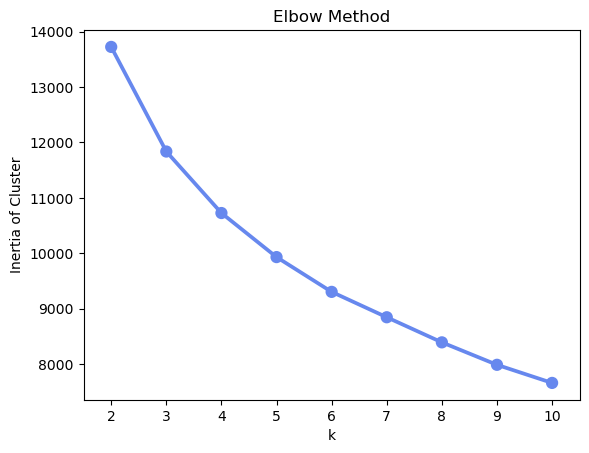

In [15]:
inertias = []
for k in range(2, 11):
    demo_clust = KMeans(n_clusters=k, random_state=47)
    demo_clust.fit(demo_data_scaled)
    inertias.append(demo_clust.inertia_)
    print('Silhouette Score: ', silhouette_score(demo_data_scaled, demo_clust.labels_, metric='euclidean'))
    
plt.title('Elbow Method')
plt.xlabel('k')
plt.ylabel('Inertia of Cluster')
sns.pointplot(x=list(range(2, 11)), y=inertias)

Looks like 4 is probably a good cluster number

In [16]:
demo_clust = KMeans(n_clusters=4, random_state=42)
demo_clust.fit(demo_data_scaled)

demo_data = demo_data.assign(ClusterLabel = demo_clust.labels_)

#### Look at the mean and median values of each demographic cluster to examine trends and see how the market is segmented

In [17]:
demo_data.groupby("ClusterLabel")["Q1r1", "Q6"].median()

C:\Users\Elliott\AppData\Local\Temp\ipykernel_29320\2852674839.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  demo_data.groupby("ClusterLabel")["Q1r1", "Q6"].median()


,Q1r1,Q6
ClusterLabel,,
0,40.0,2.0
1,30.0,2.0
2,70.0,2.0
3,20.0,2.0


Interesting that the clusters are clearly seperated by age, but the income bracket for each group is the same

In [18]:
demo_data.groupby("ClusterLabel")[demo_data.columns].median()

,Q1r1,Q4,age,Q2,region,QNEW3,Q5,Q6,ClusterLabel
ClusterLabel,,,,,,,,,
0,40.0,1.0,3.0,20.0,2.0,0.0,0.0,2.0,0.0
1,30.0,1.0,2.0,31.0,2.0,0.0,9.0,2.0,1.0
2,70.0,0.0,5.0,23.0,2.0,1.0,9.0,2.0,2.0
3,20.0,0.0,1.0,25.0,2.0,3.0,9.0,2.0,3.0


In [19]:
demo_data.groupby("ClusterLabel")[demo_data.columns].mean()

,Q1r1,Q4,age,Q2,region,QNEW3,Q5,Q6,ClusterLabel
ClusterLabel,,,,,,,,,
0,41.969466,0.547074,2.773537,20.992366,1.798982,0.463104,1.307888,1.875318,0.0
1,30.805607,0.600000,1.973832,25.325234,1.680374,0.123364,8.850467,1.424299,1.0
2,69.077465,0.469014,4.538028,23.294366,1.581690,0.971831,8.842254,2.039437,2.0
3,25.760649,0.389452,1.133874,24.673428,1.695740,3.365112,6.194726,2.525355,3.0


In [20]:
demo_data.groupby("ClusterLabel").describe()

Q1r1                                                      \
              count       mean        std   min   25%   50%   75%   max   
ClusterLabel                                                              
0             393.0  41.969466  15.941829  18.0  29.0  40.0  53.0  82.0   
1             535.0  30.805607   8.100005  14.0  25.0  30.0  35.0  53.0   
2             710.0  69.077465   8.336602  45.0  66.0  70.0  74.0  99.0   
3             493.0  25.760649  11.316561  14.0  18.0  20.0  32.0  58.0   

                 Q4                                                 age  \
              count      mean       std  min  25%  50%  75%  max  count   
ClusterLabel                                                              
0             393.0  0.547074  0.498414  0.0  0.0  1.0  1.0  1.0  393.0   
1             535.0  0.600000  0.490356  0.0  0.0  1.0  1.0  1.0  535.0   
2             710.0  0.469014  0.499391  0.0  0.0  0.0  1.0  1.0  710.0   
3             493.0  0.389452  0.488121  0.0  0.0  0.0  1.0  1.0  493.0   

                                                              Q2             \
                  mean       std  min  25%  50%  75%  max  count       mean   
ClusterLabel                                                                  
0             2.773537  1.256458  0.0  2.0  3.0  4.0  5.0  393.0  20.992366   
1             1.973832  0.976919  0.0  1.0  2.0  3.0  4.0  535.0  25.325234   
2             4.538028  0.544848  3.0  4.0  5.0  5.0  5.0  710.0  23.294366   
3             1.133874  1.298188  0.0  0.0  1.0  2.0  4.0  493.0  24.673428   

                                                    region            \
                    std  min  25%   50%   75%   max  count      mean   
ClusterLabel                                                           
0             15.049830  0.0  7.0  20.0  32.0  49.0  393.0  1.798982   
1             15.353842  0.0  9.0  31.0  37.0  50.0  535.0  1.680374   
2             14.760785  0.0  9.0  23.0  35.0  50.0  710.0  1.581690   
3             15.361790  0.0  9.0  25.0  38.0  50.0  493.0  1.695740   

                                                 QNEW3                      \
                   std  min  25%  50%  75%  max  count      mean       std   
ClusterLabel                                                                 
0             1.001427  0.0  1.0  2.0  3.0  3.0  393.0  0.463104  0.813965   
1             1.063828  0.0  1.0  2.0  3.0  3.0  535.0  0.123364  0.473765   
2             1.043998  0.0  1.0  2.0  2.0  3.0  710.0  0.971831  0.739226   
3             1.032364  0.0  1.0  2.0  2.0  3.0  493.0  3.365112  0.588300   

                                          Q5                                \
              min  25%  50%  75%  max  count      mean       std  min  25%   
ClusterLabel                                                                 
0             0.0  0.0  0.0  1.0  4.0  393.0  1.307888  1.461884  0.0  0.0   
1             0.0  0.0  0.0  0.0  2.0  535.0  8.850467  0.681535  4.0  9.0   
2             0.0  1.0  1.0  1.0  4.0  710.0  8.842254  0.833309  2.0  9.0   
3             2.0  3.0  3.0  4.0  4.0  493.0  6.194726  3.493695  0.0  3.0   

                                Q6                                          \
              50%  75%  max  count      mean       std  min  25%  50%  75%   
ClusterLabel                                                                 
0             0.0  3.0  5.0  393.0  1.875318  1.409598  0.0  1.0  2.0  2.0   
1             9.0  9.0  9.0  535.0  1.424299  1.171353  0.0  0.0  2.0  2.0   
2             9.0  9.0  9.0  710.0  2.039437  1.366998  0.0  1.0  2.0  3.0   
3             9.0  9.0  9.0  493.0  2.525355  1.353205  0.0  2.0  2.0  4.0   

                   
              max  
ClusterLabel       
0             5.0  
1             5.0  
2             5.0  
3             5.0

## News Source by Group

In [21]:
demo_news_data = pd.concat([demo_data, data.iloc[:,-1]], axis=1)

In [22]:
demo_news_data.head()

,Q1r1,Q4,age,Q2,region,QNEW3,Q5,Q6,ClusterLabel,Q89
0,36.0,1,3,10,2,0,9,2,1,Magazine
1,26.0,0,1,32,1,0,9,2,1,Print newspapers
2,32.0,0,2,30,1,0,9,4,1,News aggregators
3,25.0,0,1,4,3,0,9,4,1,Online version of newspapers
4,28.0,1,2,14,0,3,9,2,3,Online version of newspapers


C:\Users\Elliott\AppData\Local\Temp\ipykernel_29320\1758378888.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  _ = axes.set_xticklabels(['Magazine', 'Print Newspapers', 'News Aggregators', 'Online Version of Newspaper', 'Social Media', 'TV News Station', 'I do not follow news', 'Non-traditional Online news', 'Radio', 'Variety/Talk Shows'], rotation=45, ha='right')


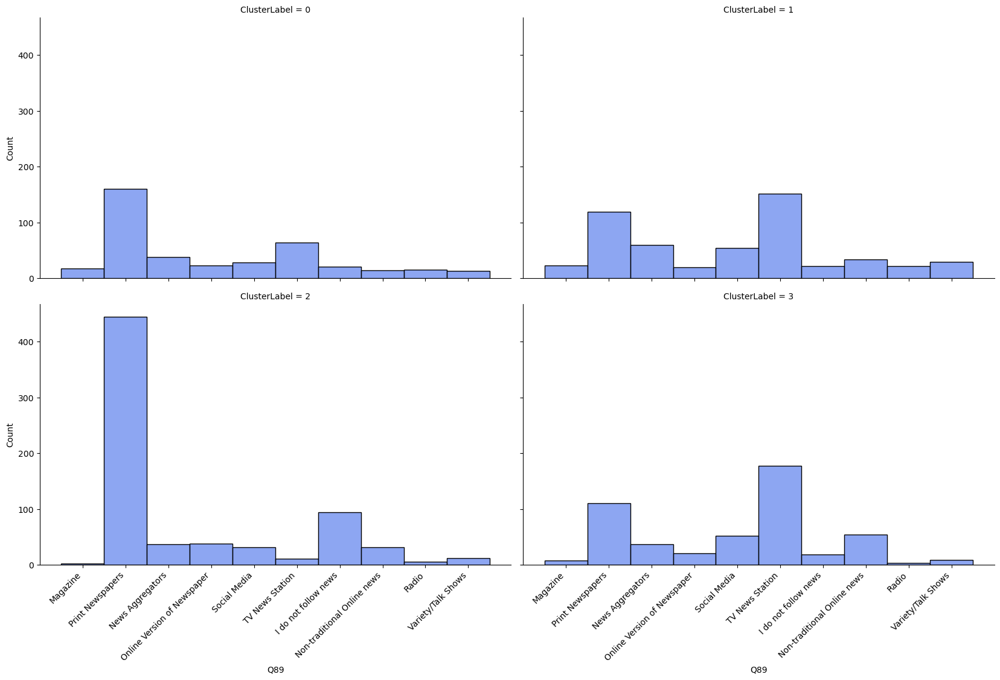

In [24]:
plot = sns.FacetGrid(demo_news_data, col='ClusterLabel', col_wrap=2, margin_titles=True, height=5, aspect=5/3)
plot.map(sns.histplot, 'Q89')
for axes in plot.axes.flat:
    _ = axes.set_xticklabels(['Magazine', 'Print Newspapers', 'News Aggregators', 'Online Version of Newspaper', 'Social Media', 'TV News Station', 'I do not follow news', 'Non-traditional Online news', 'Radio', 'Variety/Talk Shows'], rotation=45, ha='right')

[Text(0, 0, 'Magazine'),
 Text(1, 0, 'Print Newspapers'),
 Text(2, 0, 'News Aggregators'),
 Text(3, 0, 'Online Version of Newspaper'),
 Text(4, 0, 'Social Media'),
 Text(5, 0, 'TV News Station'),
 Text(6, 0, 'I do not follow news'),
 Text(7, 0, 'Non-traditional Online news'),
 Text(8, 0, 'Radio'),
 Text(9, 0, 'Variety/Talk Shows')]

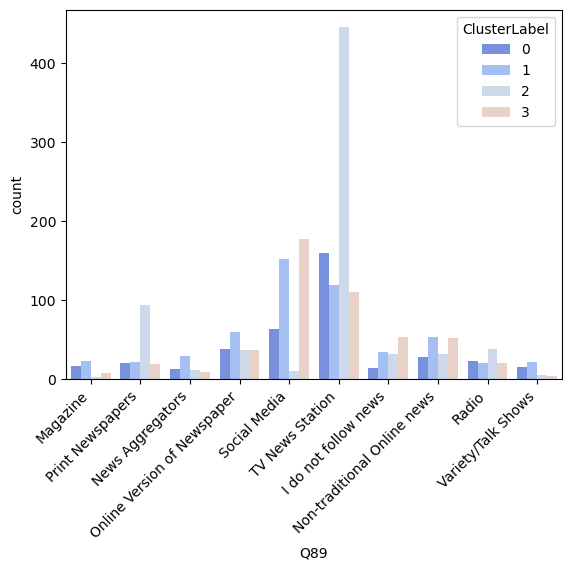

In [26]:
plot = sns.countplot(data=demo_news_data, x='Q89', hue='ClusterLabel')
plt.xticks(rotation=45, ha='right')
plot.set_xticklabels(['Magazine', 'Print Newspapers', 'News Aggregators', 'Online Version of Newspaper', 'Social Media', 'TV News Station', 'I do not follow news', 'Non-traditional Online news', 'Radio', 'Variety/Talk Shows'])

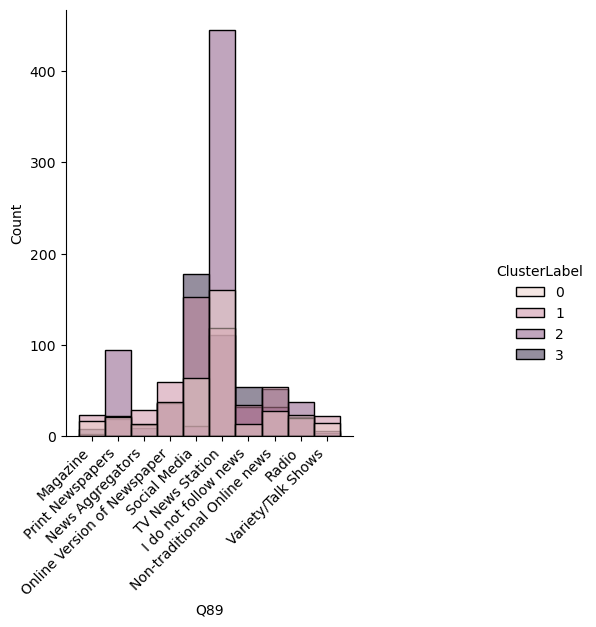

In [28]:
plot = sns.displot(demo_news_data, x='Q89', hue='ClusterLabel')
plt.xticks(rotation=45, ha='right')
plot.set_xticklabels(['Magazine', 'Print Newspapers', 'News Aggregators', 'Online Version of Newspaper', 'Social Media', 'TV News Station', 'I do not follow news', 'Non-traditional Online news', 'Radio', 'Variety/Talk Shows'])

## Pay for Double Download Speed by Group

In [28]:
len(survey[survey['Q1r1']==25])

35

In [30]:
demo_double_download_data = pd.concat([demo_data, survey['Q29']], axis=1)

In [31]:
label_order = ['I am not willing to pay more for faster download speeds as my current speed is sufficient for my needs',
'I prefer faster speed but I am unwilling to pay more than I already do',
'I am willing to pay $5 per month on top of what I already pay',
'I am willing to pay $10 per month on top of what I already pay',
'I am willing to pay $20 per month on top of what I already pay',
'I am willing to pay $30 or more per month on top of what I already pay']

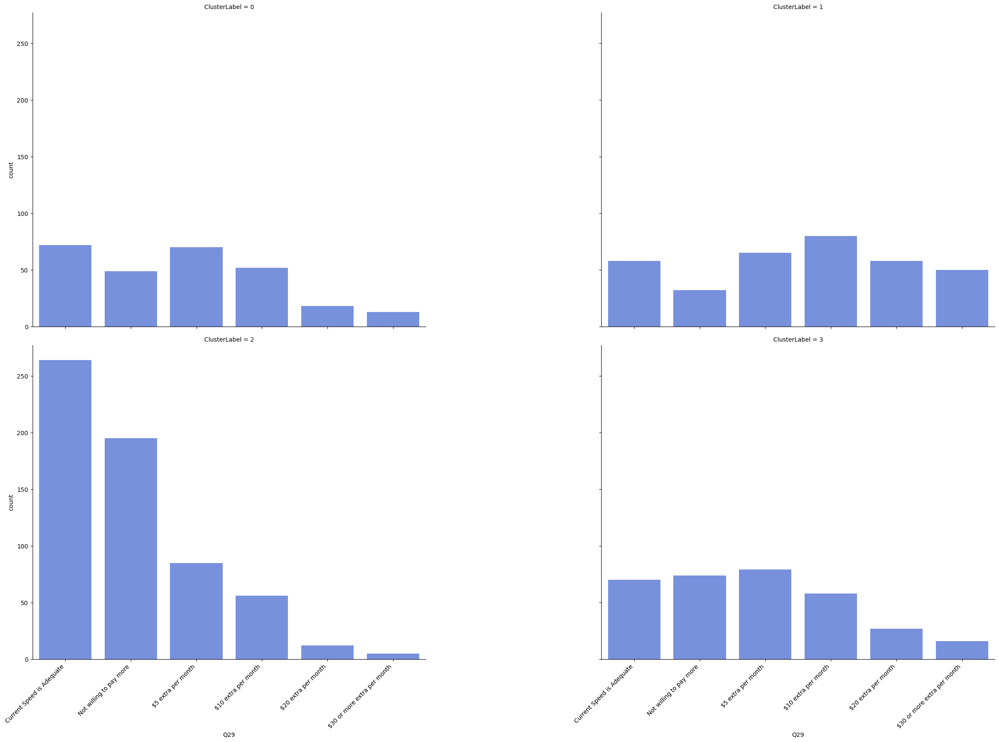

In [32]:
plot = sns.FacetGrid(demo_double_download_data, col='ClusterLabel', col_wrap=2, margin_titles=True, height=8, aspect=5/3)
plot.map(sns.countplot, 'Q29', order=label_order)
for axes in plot.axes.flat:
    _ = axes.set_xticklabels(['Current Speed is Adequate', 'Not willing to pay more', '$5 extra per month', '$10 extra per month', '$20 extra per month', '$30 or more extra per month'], rotation=45, ha='right')

[Text(0, 0, 'Current Speed is Adequate'),
 Text(1, 0, 'Not willing to pay more'),
 Text(2, 0, '$5 extra per month'),
 Text(3, 0, '$10 extra per month'),
 Text(4, 0, '$20 extra per month'),
 Text(5, 0, '$30 or more extra per month')]

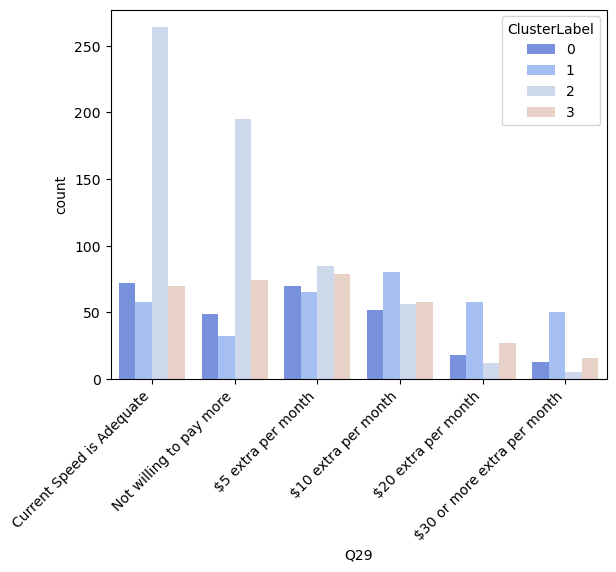

<Figure size 2100x1300 with 0 Axes>

In [33]:
plot = sns.countplot(data=demo_double_download_data, x='Q29', hue='ClusterLabel', order=label_order)
plt.xticks(rotation=45, ha='right')
plt.figure(figsize=(21,13))
plot.set_xticklabels(['Current Speed is Adequate', 'Not willing to pay more', '$5 extra per month', '$10 extra per month', '$20 extra per month', '$30 or more extra per month'])

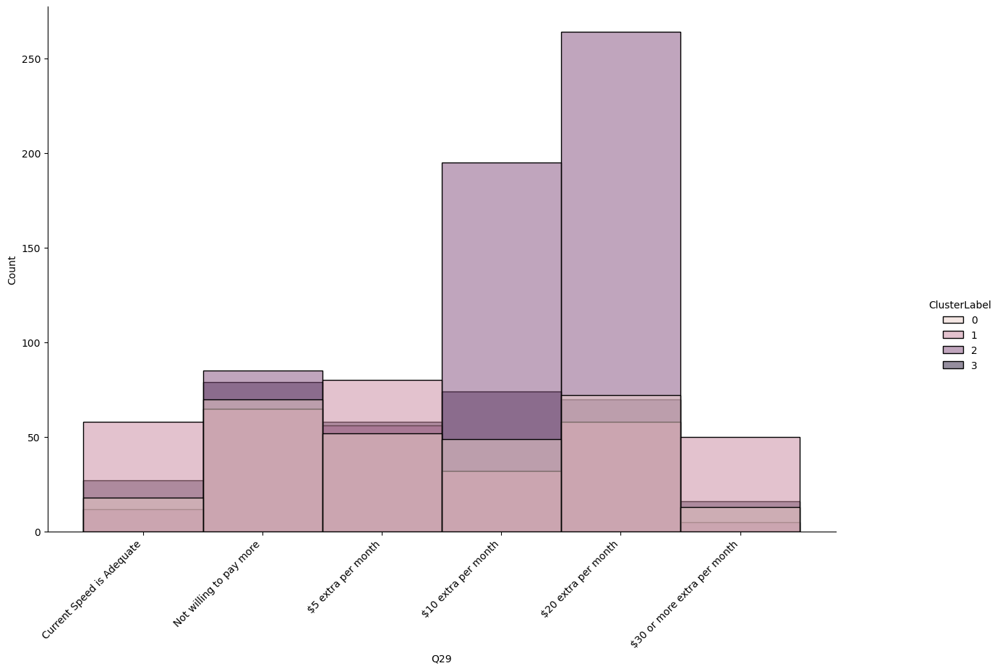

In [34]:
plot = sns.displot(demo_double_download_data, x='Q29', hue='ClusterLabel', height=8, aspect=13/8)
plt.xticks(rotation=45, ha='right')
plot.set_xticklabels(['Current Speed is Adequate', 'Not willing to pay more', '$5 extra per month', '$10 extra per month', '$20 extra per month', '$30 or more extra per month'])

## Sharing Log In Info by Group

In [77]:
demo_info_share_data = pd.concat([demo_data, survey['QNEW28']], axis=1)

In [91]:
category_order = ['Frequently (every day/weekly)',
'Occasionally (monthly)',
'Rarely (one to three times a year)',
'Never']

In [78]:
demo_info_share_data.head()

,Q1r1,Q4,age,Q2,region,QNEW3,Q5,Q6,ClusterLabel,QNEW28
0,36.0,1,3,10,2,0,9,2,1,Frequently (every day/weekly)
1,26.0,0,1,32,1,0,9,2,1,Frequently (every day/weekly)
2,32.0,0,2,30,1,0,9,4,1,Frequently (every day/weekly)
3,25.0,0,1,4,3,0,9,4,1,Frequently (every day/weekly)
4,28.0,1,2,14,0,3,9,2,3,Frequently (every day/weekly)


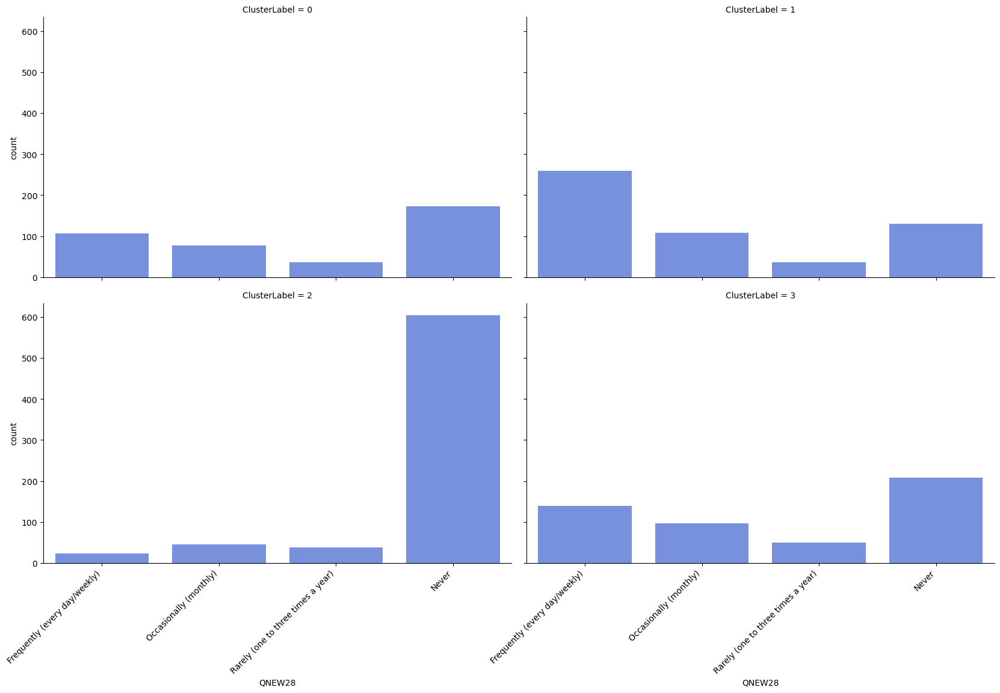

In [109]:
plot = sns.FacetGrid(demo_info_share_data, col='ClusterLabel', col_wrap=2, margin_titles=True, height=5, aspect=5/3)
plot.map(sns.countplot, 'QNEW28', order=category_order)
for axes in plot.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=45, ha='right')

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Frequently (every day/weekly)'),
  Text(1, 0, 'Occasionally (monthly)'),
  Text(2, 0, 'Rarely (one to three times a year)'),
  Text(3, 0, 'Never')])

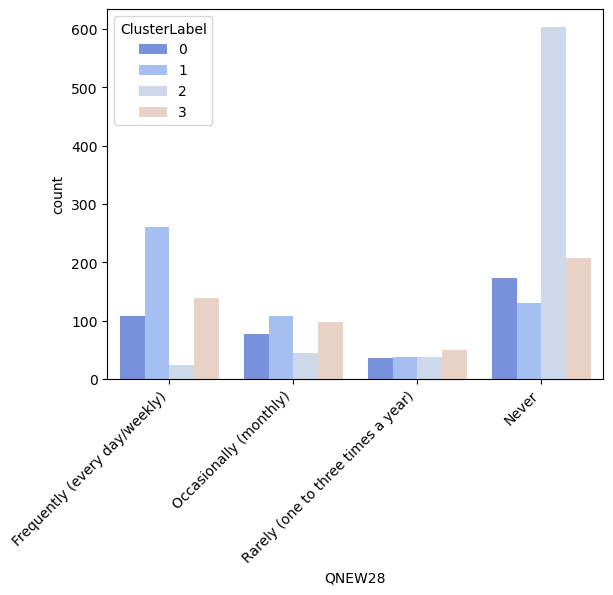

In [107]:
sns.countplot(data=demo_info_share_data, x='QNEW28', hue='ClusterLabel', order=category_order)
plt.xticks(rotation=45, ha='right')

([0, 1, 2, 3],
 [Text(0, 0, 'Frequently (every day/weekly)'),
  Text(1, 0, 'Occasionally (monthly)'),
  Text(2, 0, 'Never'),
  Text(3, 0, 'Rarely (one to three times a year)')])

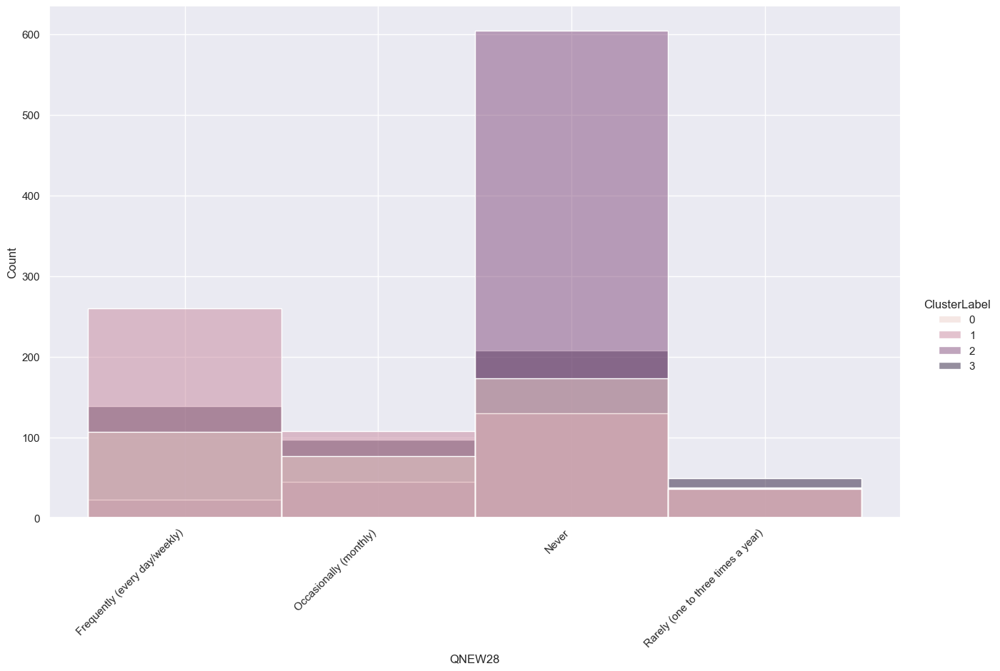

In [57]:
sns.displot(demo_info_share_data, x='QNEW28', hue='ClusterLabel', height=8, aspect=13/8)
plt.xticks(rotation=45, ha='right')